# Imports

In [1]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('./..')
sys.path.append('./../..')

from utils import robust_percentile_normalization, shift_stimulus_to_phosphene_centroid

import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt

from dynaphos import utils
from dynaphos.simulator import GaussianSimulator as PhospheneSimulator


import math

import pickle

# Simulator

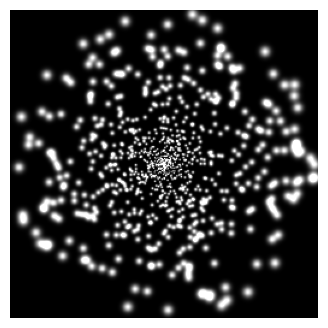

In [2]:
# Load the simulator configuration file (and adjust to preferences).
params = utils.load_params('../config/params.yaml')
params['run']['view_angle'] = 16

# open from pickle file:
path = '../electrode_schemes/defaultcoordinatemap_1024.pickle' # view_angle = 16
# path = '../electrode_schemes/4utaharrays.pickle' # view_angle = 16
# path = '../electrode_schemes/1utaharray.pickle' # view_angle = 0.4
# path = '../electrode_schemes/neuralink.pickle' # view_angle = 25
# path = '../electrode_schemes/utahRFs.pickle' # view_angle = 6

with open(path, 'rb') as f:
    phosphene_coords = pickle.load(f)

n_phosphenes = len(phosphene_coords)


# # Initialize simulator
simulator = PhospheneSimulator(params, phosphene_coords)

# Stimulation amplitude
amplitude = params['sampling']['stimulus_scale'] # Ampère (160 µA)

# Stimulation vector
stim = amplitude * torch.ones(n_phosphenes).cuda().detach() # (All electrodes are activated)

# Reset and call the simulator
simulator.reset()
phosphenes = simulator(stim)

# Show the phosphene image
plt.figure(figsize=(4, 4))
plt.imshow(phosphenes.cpu()[0], cmap='gray')
plt.axis('off')
plt.show()

# Uniformity

Iterations:   0%|                                                                                                                                                                                                                           | 0/1000 [00:00<?, ?iter/s]

Loss = 0.0017: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:04<00:00, 227.83iter/s]


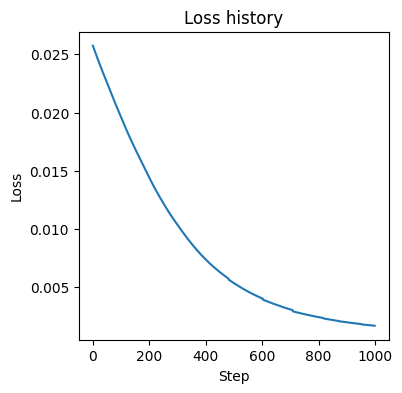

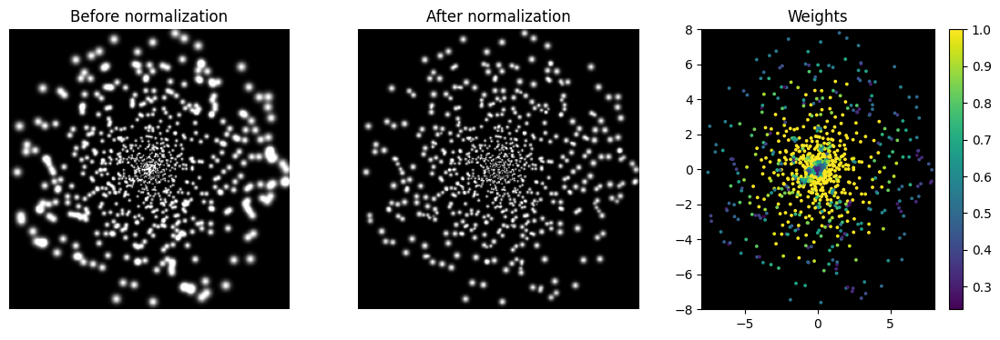

Percentage of amplitude: 73.37%


In [3]:
from phosphene.uniformity import DynamicAmplitudeNormalizer

stim_init = amplitude * torch.ones(simulator.num_phosphenes, device='cuda')

normalizer = DynamicAmplitudeNormalizer(
    simulator=simulator,
    base_size=3,
    scale=0.1,
    A_min=0,
    A_max=amplitude,
    learning_rate=0.005,
    steps=1000,
    target=None  # or a specific float
)
stim_final = normalizer.run(stim_init, verbose=True)
stim_weights = normalizer.weights

# plot the loss_history from the normalizer
plt.figure(figsize=(4, 4))
plt.plot(normalizer.loss_history)
plt.xlabel('Step')
plt.ylabel('Loss')
plt.title('Loss history')
plt.show()

# Visualize
simulator.reset()
phos_image_before = simulator(stim_init)
simulator.reset()
phos_image_after  = simulator(stim_init * stim_weights)

# visualize the phosphene images and the weights in a scatterplot
plt.figure(figsize=(14, 4))
plt.subplot(1, 3, 1)
plt.imshow(phos_image_before.cpu()[0], cmap='gray')
plt.axis('off')
plt.title('Before normalization')

plt.subplot(1, 3, 2)
plt.imshow(phos_image_after.cpu()[0], cmap='gray')
plt.axis('off')
plt.title('After normalization')

plt.subplot(1, 3, 3)
phosphene_coords = simulator.coordinates
plt.scatter(phosphene_coords._x, -phosphene_coords._y, c=stim_weights.cpu(), cmap='viridis', s=3)
# extend the axes to the full image size
fov = simulator.params['run']['view_angle']
plt.xlim(-fov/2, fov/2)
plt.ylim(-fov/2, fov/2)
# black background
plt.gca().set_facecolor('black')
plt.colorbar()
plt.title('Weights')
plt.show()

# percentage of amplitude compared to full amplitude
print(f'Percentage of amplitude: {stim_weights.sum() / simulator.num_phosphenes*100:.2f}%')

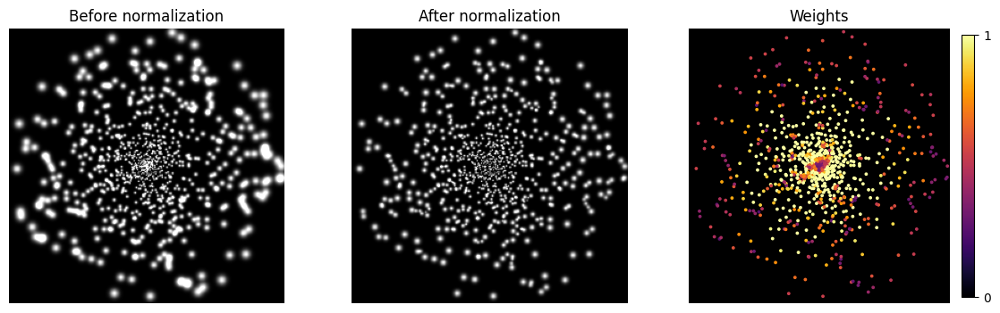

In [4]:
# For the paper

# visualize the phosphene images and the weights in a scatterplot
plt.figure(figsize=(14, 4))
plt.subplot(1, 3, 1)
plt.imshow(phos_image_before.cpu()[0], cmap='gray')
plt.axis('off')
plt.title('Before normalization')

plt.subplot(1, 3, 2)
plt.imshow(phos_image_after.cpu()[0], cmap='gray')
plt.axis('off')
plt.title('After normalization')
# third subplot: weights
ax = plt.subplot(1, 3, 3)
phosphene_coords = simulator.coordinates
cmap = 'inferno'
sc = ax.scatter(
    phosphene_coords._x, -phosphene_coords._y,
    c=stim_weights.cpu(), cmap=cmap, s=3, vmin=0.0, vmax=1.0
)

# full-FOV limits
fov = simulator.params['run']['view_angle']
ax.set_xlim(-fov/2, fov/2)
ax.set_ylim(-fov/2, fov/2)

# black background
ax.set_facecolor('black')

# remove ticks and spines but keep facecolor
ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
for spine in ax.spines.values():
    spine.set_visible(False)

# colorbar with only 0 and 1 
cb = plt.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)
cb.set_ticks([0.0, 1.0])
cb.set_ticklabels(['0', '1'])

plt.title('Weights')
plt.show()

# Phosphene Density Maps

In [5]:
from phosphene.density import VisualFieldMapper

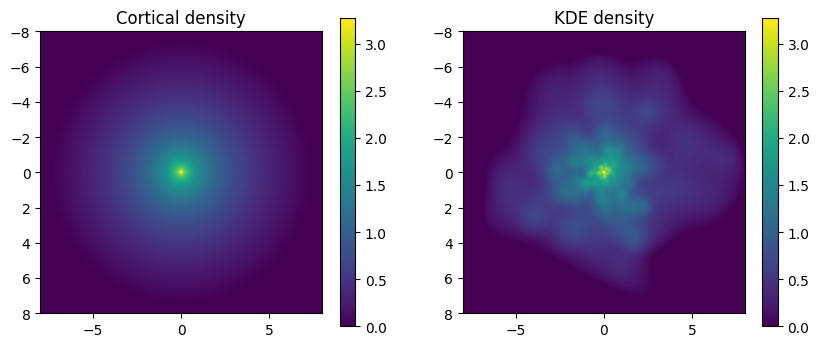

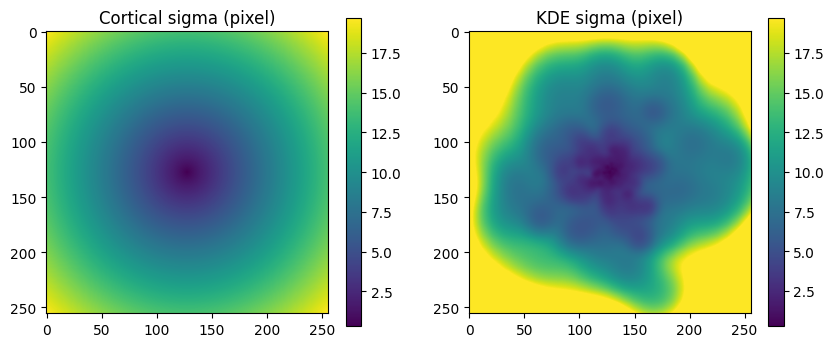

In [6]:
mapper = VisualFieldMapper(simulator=simulator)

# 1) Cortical approach:
density_cortical = mapper.build_density_map_cortical(total_phosphenes=n_phosphenes)
sigma_cortical_fov = mapper.build_sigma_map_from_density(density_cortical, space="fov")
sigma_cortical_pix = mapper.build_sigma_map_from_density(density_cortical, space="pixel")

# 2) KDE approach:
density_kde = mapper.build_density_map_kde(k=6, alpha=1.0, total_phosphenes=n_phosphenes)
sigma_kde_fov = mapper.build_sigma_map_from_density(density_kde, space="fov")
sigma_kde_pix = mapper.build_sigma_map_from_density(density_kde, space="pixel")

# show density maps
fov = params['run']['view_angle']

plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.imshow(np.log10(density_cortical), cmap='viridis', extent=[-fov/2, fov/2, fov/2, -fov/2], vmin=0)
plt.colorbar()
plt.title('Cortical density')

plt.subplot(1, 2, 2)
plt.imshow(np.log10(density_kde), cmap='viridis', extent=[-fov/2, fov/2, fov/2, -fov/2], vmax=np.log10(density_cortical.max()), vmin=0)
plt.colorbar()
plt.title('KDE density')
plt.show()

# plot sigma_cortical_pix, sigma_kde_pix
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.imshow(sigma_cortical_pix, cmap='viridis')
plt.colorbar()
plt.title('Cortical sigma (pixel)')

plt.subplot(1, 2, 2)
plt.imshow(sigma_kde_pix, cmap='viridis', vmax=sigma_cortical_pix.max())
plt.colorbar()
plt.title('KDE sigma (pixel)')
plt.show()

In [7]:
# Find centroid
x_center, y_center = mapper.centroid_of_density(density_kde)
print(f'Centroid of cortical density: ({x_center:.2f}, {y_center:.2f}) degrees')

Centroid of cortical density: (0.04, -0.02) degrees


# Image processing for Phosphene Vision

In [8]:
from spatial_frequency.components.SeparableModulated2d import SeparableModulatedConv2d
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision.datasets import CocoDetection

# 1) Define your weighted‐grayscale Lambda
rgb_weights = torch.tensor([0.2126, 0.7152, 0.0722]).view(3,1,1)
to_weighted_grayscale = transforms.Lambda(
    lambda img: (img * rgb_weights).sum(dim=0, keepdim=True)
)

# 2) Build your full pipeline
t = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),            # → [C,H,W] in [0,1]
    to_weighted_grayscale,            # → [1,H,W] weighted luma
])

folder = '/projects/prjs0344/Dynaphos/data/face/LaPa/'
# folder = '/projects/prjs0344/Dynaphos/data/SUN/SUN397'

data_loader = DataLoader(
    ImageFolder(folder, transform=t),
    batch_size=1,
    shuffle=False
)

# # where you unzipped train2017/val2017 and annotations/
# data_root = "/projects/prjs0344/Dynaphos/data/coco"
# img_dir    = os.path.join(data_root, "val2017")
# ann_file   = os.path.join(data_root, "annotations", "instances_val2017.json")

# coco_val = CocoDetection(root=img_dir,
#                          annFile=ann_file,
#                          transform=t)
# data_loader = DataLoader(coco_val, batch_size=1, shuffle=False)

# print(len(data_loader))

In [9]:
sigma_map_tensor = torch.tensor(sigma_kde_pix).float().cuda().detach()

mod_layer = SeparableModulatedConv2d(
    in_channels=1,
    sigma_map=sigma_map_tensor
).cuda()
mod_layer.eval()


# choose a fixed DoG scale
mean_sigma = sigma_cortical_pix.mean()
mean_sigma_map = torch.ones_like(sigma_map_tensor) * mean_sigma 

fixed_model_layer = SeparableModulatedConv2d(
    in_channels=1,
    sigma_map=mean_sigma_map
).cuda()
fixed_model_layer.eval()

sigma1 = torch.ones_like(sigma_map_tensor) * 3.0

fixed1_mod_layer = SeparableModulatedConv2d(
    in_channels=1,
    sigma_map=sigma1
).cuda()
fixed1_mod_layer.eval()

SeparableModulatedConv2d()

In [10]:
import os
import torch
import torch.nn.functional as F
import numpy as np
import cv2

# ---------- helpers ----------

def normalize01(t):
    tmin = float(t.min())
    tmax = float(t.max())
    if tmax - tmin < 1e-8:
        return torch.zeros_like(t)
    return (t - tmin) / (tmax - tmin)

def dilation5x5(x):
    # x: [B,1,H,W] tensor in [0,1]
    return F.max_pool2d(x, kernel_size=5, stride=1, padding=2)

def dog_fixed_from_numpy(np_gray, sigma=2.0, k=1.6):
    """
    Difference of Gaussians with fixed scale across the field.
    np_gray in [0,1], shape [H,W].
    """
    s1 = sigma
    s2 = sigma * k
    # OpenCV uses sigmaX, sigmaY in pixels
    g1 = cv2.GaussianBlur(np_gray, ksize=(0,0), sigmaX=s1, sigmaY=s1, borderType=cv2.BORDER_REFLECT)
    g2 = cv2.GaussianBlur(np_gray, ksize=(0,0), sigmaX=s2, sigmaY=s2, borderType=cv2.BORDER_REFLECT)
    dog = g1 - g2
    # clip > 0
    dog = np.clip(dog, 0, None)
    # dog = (dog - dog.min()) / (dog.max() - dog.min() + 1e-8)
    return dog.astype(np.float32)

def canny_edges_from_numpy(np_gray, low=100, high=200, dilate=True):
    """
    Canny on uint8 image, optional dilation to match edge thickness.
    """
    u8 = (np_gray * 255.0).astype(np.uint8)
    ce = cv2.Canny(u8, low, high).astype(np.float32) / 255.0
    t = torch.from_numpy(ce).view(1,1,ce.shape[0], ce.shape[1])
    if dilate:
        t = dilation3x3(t)
    return t.squeeze(0).squeeze(0).numpy().astype(np.float32)

# HED setup (OpenCV DNN). Provide your file paths.
HED_PROTO   = "models/hed/deploy.prototxt"
HED_WEIGHTS = "models/hed/hed_pretrained_bsds.caffemodel"
USE_HED = os.path.exists(HED_PROTO) and os.path.exists(HED_WEIGHTS)
hed_net = None
if USE_HED:
    hed_net = cv2.dnn.readNetFromCaffe(HED_PROTO, HED_WEIGHTS)

def hed_edges_from_numpy(np_gray, dilate=True):
    """
    HED via OpenCV DNN. Expects grayscale [0,1] float image.
    """
    if not USE_HED or hed_net is None:
        raise FileNotFoundError("HED model files not found. Set HED_PROTO and HED_WEIGHTS.")
    H, W = np_gray.shape
    # HED expects BGR with ImageNet style mean subtraction
    bgr = cv2.cvtColor((np_gray*255).astype(np.uint8), cv2.COLOR_GRAY2BGR)
    blob = cv2.dnn.blobFromImage(bgr, scalefactor=1.0, size=(W, H),
                                 mean=(104.00698793, 116.66876762, 122.67891434),
                                 swapRB=False, crop=False)
    hed_net.setInput(blob)
    out = hed_net.forward()          # shape [1,1,H,W]
    hed = out[0,0]
    hed = (hed - hed.min()) / (hed.max() - hed.min() + 1e-8)
    t = torch.from_numpy(hed).view(1,1,H,W)
    if dilate:
        t = dilation5x5(t)
    return t.squeeze(0).squeeze(0).numpy().astype(np.float32)

def make_stim_phos(simulator, stim: torch.Tensor, amplitude, threshold, stim_weights, normalization=True):
    """
    stim: [B, C, H, W]
    returns: (stim, phos) both [B, C, H, W]
    """
    simulator.reset()
    elec = simulator.sample_stimulus(stim, rescale=False)
    if normalization:
        elec = robust_percentile_normalization(
            elec,
            amplitude,
            threshold=threshold,
            low_perc=5,
            high_perc=90,
            gamma=1/3
        )
    else:
        elec = elec * amplitude
    elec = elec * stim_weights
    phos = simulator(elec)

    if phos.dim() == 2:      # [H,W]
        phos = phos.unsqueeze(0).unsqueeze(0)
    elif phos.dim() == 3:    # [C,H,W]
        phos = phos.unsqueeze(0)
    return stim, phos


In [11]:
def rand_perlin_2d(shape, res, fade = lambda t: 6*t**5 - 15*t**4 + 10*t**3):
    delta = (res[0] / shape[0], res[1] / shape[1])
    d = (shape[0] // res[0], shape[1] // res[1])
    
    grid = torch.stack(torch.meshgrid(torch.arange(0, res[0], delta[0]), torch.arange(0, res[1], delta[1])), dim = -1) % 1
    angles = 2*math.pi*torch.rand(res[0]+1, res[1]+1)
    gradients = torch.stack((torch.cos(angles), torch.sin(angles)), dim = -1)
    
    tile_grads = lambda slice1, slice2: gradients[slice1[0]:slice1[1], slice2[0]:slice2[1]].repeat_interleave(d[0], 0).repeat_interleave(d[1], 1)
    dot = lambda grad, shift: (torch.stack((grid[:shape[0],:shape[1],0] + shift[0], grid[:shape[0],:shape[1], 1] + shift[1]  ), dim = -1) * grad[:shape[0], :shape[1]]).sum(dim = -1)
    
    n00 = dot(tile_grads([0, -1], [0, -1]), [0,  0])
    n10 = dot(tile_grads([1, None], [0, -1]), [-1, 0])
    n01 = dot(tile_grads([0, -1],[1, None]), [0, -1])
    n11 = dot(tile_grads([1, None], [1, None]), [-1,-1])
    t = fade(grid[:shape[0], :shape[1]])
    return math.sqrt(2) * torch.lerp(torch.lerp(n00, n10, t[..., 0]), torch.lerp(n01, n11, t[..., 0]), t[..., 1])

def dilation3x3(img, kernel=None):
    if kernel is None:
        kernel = torch.tensor([[[
                              [ 0, 1., 0.],
                              [ 1., 1., 1.],
                              [ 0., 1., 0.],]]], requires_grad=False, device=img.device)
    return torch.clamp(torch.nn.functional.conv2d(img, kernel, padding=kernel.shape[-1]//2), 0, 1)

def dilation5x5(img, kernel=None):
    if kernel is None:
        kernel = torch.tensor([[[
                              [ 0, 0, 1., 0, 0],
                              [ 0, 1., 1., 1., 0],
                              [ 1., 1., 1., 1., 1.],
                              [ 0, 1., 1., 1., 0],
                              [ 0, 0, 1., 0, 0],]]], requires_grad=False, device=img.device)
    return torch.clamp(torch.nn.functional.conv2d(img, kernel, padding=kernel.shape[-1]//2), 0, 1)

In [36]:
image_processing_dict = {}
threshold = params['thresholding']['rheobase']

for idx, (images, _) in enumerate(data_loader):
    images = images.cuda()             # [1,1,H,W]
    images = torch.Tensor(shift_stimulus_to_phosphene_centroid(
        img=images[0][0].cpu().numpy(),
        centroid=(x_center, y_center),
        fov=params['run']['view_angle'],
        mode='constant',
        cval=0.0
    )).unsqueeze(0).unsqueeze(0).cuda()
    orig = images

    # SCAPE DoG (your adaptive mod_layer)
    dog = mod_layer(orig).detach().cpu().clip(0, None)
    dog = normalize01(dog).cuda()      # [1,1,H,W]

    # Fixed DoG
    np_gray = orig[0,0].cpu().numpy().astype(np.float32)
    dog_fix = fixed_model_layer(orig).detach().cpu().clip(0, None)
    dog_fix = normalize01(dog_fix).cuda()      # [1,1,H,W]

    dog_fix1 = fixed1_mod_layer(orig).detach().cpu().clip(0, None)
    dog_fix1 = normalize01(dog_fix1).cuda()      # [1,1,H,W]

    # Canny
    ce_np = canny_edges_from_numpy(np_gray, low=100, high=200, dilate=True)
    ce = torch.from_numpy(ce_np).unsqueeze(0).unsqueeze(0).cuda()

    # HED (if available)
    if USE_HED:
        hed_np = hed_edges_from_numpy(np_gray, dilate=True)
        hed = torch.from_numpy(hed_np).unsqueeze(0).unsqueeze(0).cuda()
    else:
        hed = None  # we will skip adding it if not available

    # Random Perlin (fixed)
    rp = rand_perlin_2d((256,256),(4,4)).float()
    rp = normalize01(rp).unsqueeze(0).unsqueeze(0).cuda()

    # # black and white
    # black = torch.zeros_like(orig).cuda()
    # white = torch.ones_like(orig).cuda()

    # stimulate and simulate
    stim_gs, phos_gs        = make_stim_phos(simulator, orig,     amplitude, threshold, stim_weights)
    stim_dog, phos_dog      = make_stim_phos(simulator, dog,      amplitude, threshold, stim_weights)
    stim_dogf, phos_dogf    = make_stim_phos(simulator, dog_fix,  amplitude, threshold, stim_weights)
    stim_dog1, phos_dog1    = make_stim_phos(simulator, dog_fix1,  amplitude, threshold, stim_weights)
    stim_ce, phos_ce        = make_stim_phos(simulator, ce,       amplitude, threshold, stim_weights)
    if hed is not None:
        stim_hed, phos_hed  = make_stim_phos(simulator, hed,      amplitude, threshold, stim_weights)
    stim_rp, phos_rp        = make_stim_phos(simulator, rp,       amplitude, threshold, stim_weights)
    # stim_white, phos_white  = make_stim_phos(simulator, white,    amplitude, threshold, stim_weights, normalization=False)

    entry = {
        'image': orig,
        # 'Grayscale':    {'stim': stim_gs,   'phosphenes': phos_gs},
        'SCAPE DoG': {'stim': stim_dog,  'phosphenes': phos_dog},     # SCAPE adaptive
        # 'DoG_fixed':    {'stim': stim_dogf, 'phosphenes': phos_dogf},    # steady sigma
        'DoG fixed':   {'stim': stim_dog1, 'phosphenes': phos_dog1},    # steady sigma
        'Canny edge':   {'stim': stim_ce,   'phosphenes': phos_ce},
        'Random':       {'stim': stim_rp,   'phosphenes': phos_rp},
        # 'black':        {'stim': black,     'phosphenes': black},
        # 'white':        {'stim': stim_white,'phosphenes': phos_white},
    }
    if hed is not None:
        entry['HED_edge'] = {'stim': stim_hed, 'phosphenes': phos_hed}

    image_processing_dict[idx] = entry

    if idx == 50:
        break


/scratch-local/mappel.14343254/ipykernel_1063598/3786391332.py:82: DeprecationWarning: High values detected! Activation mask not longer rescaled as default behaviour. Please set rescale=True to map pixels in range [0, 1] or [0, 255] to the default stimulus scale.
  elec = simulator.sample_stimulus(stim, rescale=False)


In [38]:
import matplotlib.pyplot as plt
torch.use_deterministic_algorithms(False)

def show_images(idx):
    data   = image_processing_dict[idx]
    # collect all the keys except the raw 'image'
    methods = [k for k in data.keys() if k != 'image']
    n_cols  = 1 + len(methods)   # one column for the original + one for each method

    fig, axes = plt.subplots(2, n_cols,
                             figsize=(3*n_cols, 6),
                             squeeze=False)

    # --- Row 0, Col 0: the original ---
    orig = data['image'][0, 0].cpu().numpy()
    ax = axes[0, 0]
    ax.imshow(orig, cmap='gray')
    ax.set_title('Original')
    ax.axis('off')

    # leave the bottom-left empty (no phos for original)
    axes[1, 0].axis('off')

    for j, key in enumerate(methods, start=1):
        stim = data[key]['stim'][0, 0].cpu().numpy()
        phos = data[key]['phosphenes'][0, 0].cpu().numpy()

        # stimulus in row 0
        ax = axes[0, j]
        ax.imshow(stim, cmap='gray', vmin=0, vmax=1)
        ax.set_title(f'Stimulus: {key}')
        ax.axis('off')

        # phosphenes in row 1
        ax = axes[1, j]
        ax.imshow(phos, cmap='gray', vmin=0, vmax=1)
        ax.set_title(f'Phos: {key}')
        ax.axis('off')

    plt.tight_layout()
    plt.show()

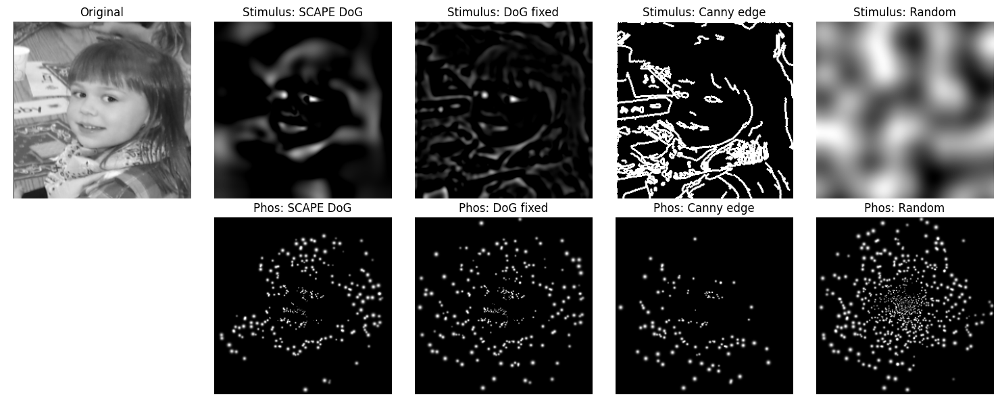

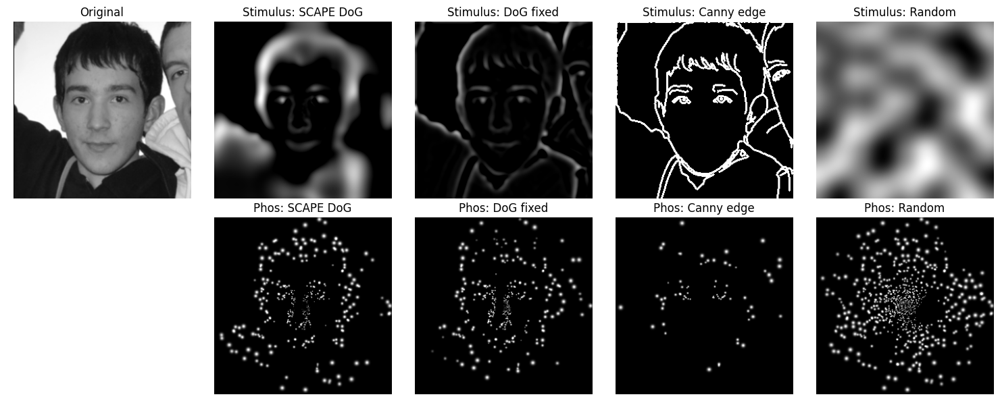

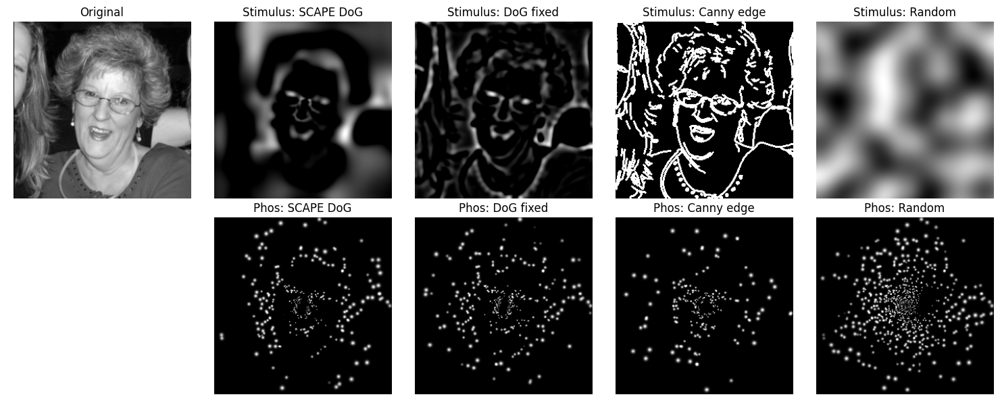

In [58]:
show_images(28)
show_images(4)
show_images(13)

# RDM

Device: cuda
N images: 500
Feature dim after pooling and RP: 1024


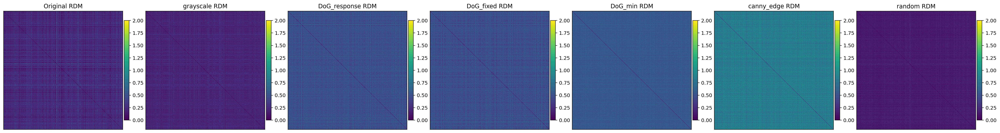

         method       rho        lo        hi    p_perm    p_holm  \
0     grayscale  0.708764  0.686415  0.733435  0.009901  0.059406   
1    canny_edge  0.042206 -0.000246  0.088085  0.029703  0.148515   
2     DoG_fixed  0.038571 -0.000958  0.089848  0.049505  0.198020   
3        random  0.020238 -0.016852  0.063291  0.158416  0.475248   
4       DoG_min -0.009990 -0.045348  0.039641  0.722772  1.000000   
5  DoG_response -0.020111 -0.057305  0.035464  0.772277  1.000000   

   frac_ceiling   EV_norm  
0      0.718681  0.516502  
1      0.042796  0.001832  
2      0.039111  0.001530  
3      0.020521  0.000421  
4     -0.010130  0.000103  
5     -0.020392  0.000416  


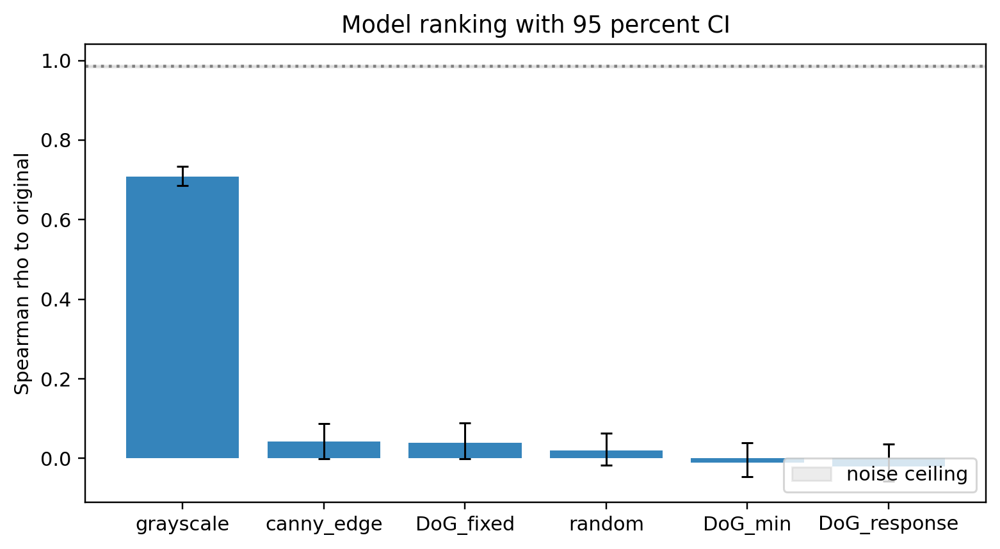

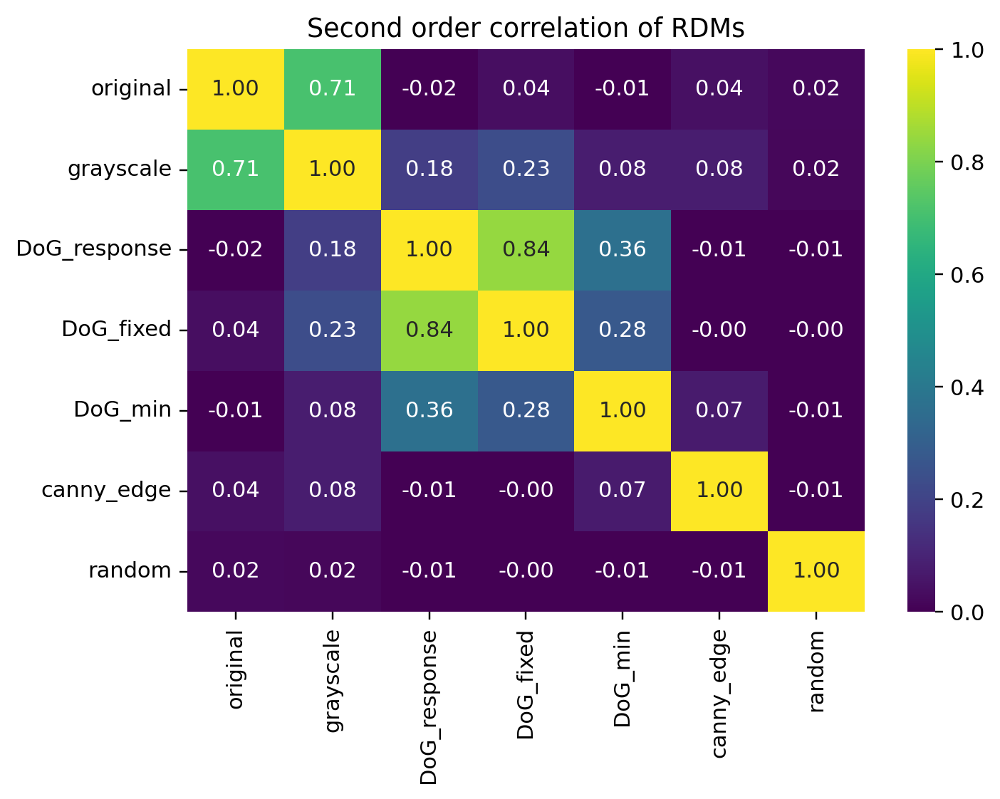

/scratch-local/mappel.14317077/ipykernel_3907616/444261295.py:227: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z = linkage(D2, method="average")


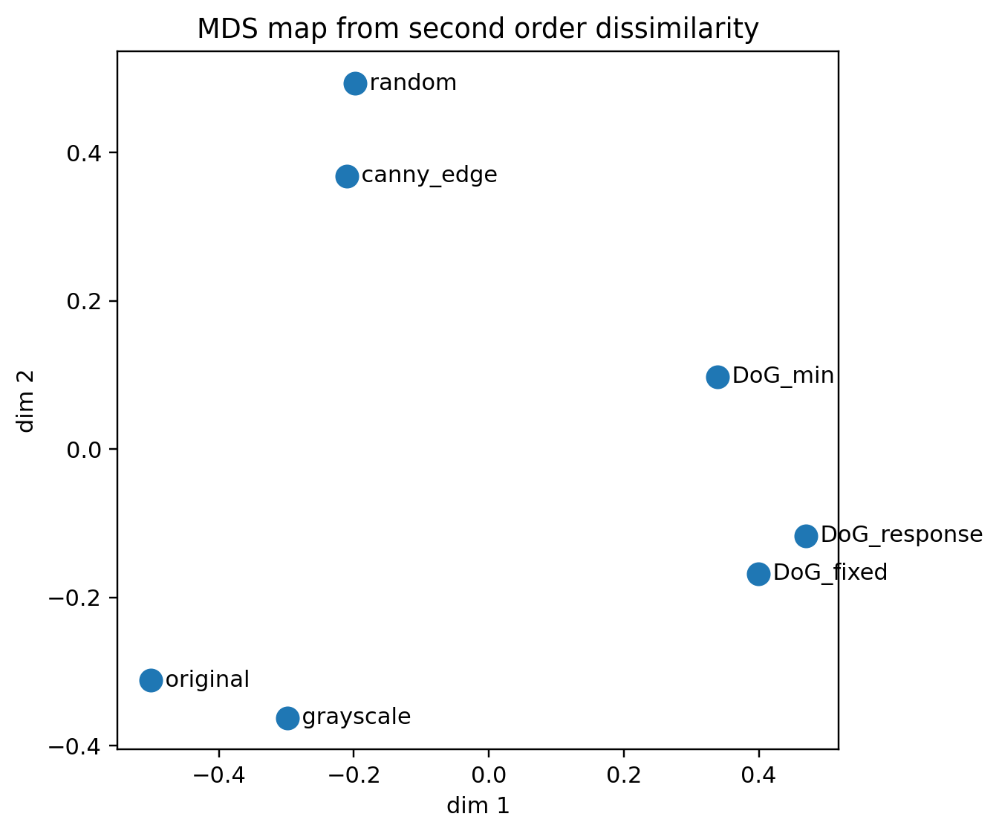

In [14]:
"""
RSA analysis without masking
Assumes image_processing_dict like:
  image_processing_dict[idx]['image'] -> torch tensor [1,1,H,W] in [0,1]
  image_processing_dict[idx][method]['phosphenes'] -> tensor [1,1,H,W] in [0,1]
"""

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import spearmanr
from scipy.cluster.hierarchy import linkage, leaves_list

import torch
import torch.nn.functional as F

# =============== CONFIG ===============
SAVE_DIR    = "./rsa_out_nomask"
POOL_K      = 4              # try 2 or 4
USE_RP      = True           # random projection to target dim
RP_DIM      = 1024
N_BOOT      = 100           # raise to 5000 to 10000 for final export
N_PERM      = 100           # raise to 10000 if you need tiny p
RANDOM_SEED = 1234
FIG_DPI     = 220

os.makedirs(SAVE_DIR, exist_ok=True)
device = "cuda" if torch.cuda.is_available() else "cpu"
rng = np.random.default_rng(RANDOM_SEED)

# =============== HELPERS ===============
def build_stacks_no_mask(ipd, methods):
    ids = sorted(ipd.keys())
    orig = []
    meth = {m: [] for m in methods}
    H = ipd[ids[0]]['image'][0,0].shape[0]
    W = ipd[ids[0]]['image'][0,0].shape[1]
    for i in ids:
        img = ipd[i]['image'][0,0].cpu().numpy().astype(np.float32)
        orig.append(img.ravel())
        for m in methods:
            ph = ipd[i][m]['phosphenes'][0,0].cpu().numpy().astype(np.float32)
            meth[m].append(ph.ravel())
    orig = np.stack(orig, 0)
    meth = {m: np.stack(meth[m], 0) for m in methods}
    return orig, meth, H, W

def avgpool_numpy_imgs(X_np_flat, H, W, k=2):
    X = torch.from_numpy(X_np_flat.astype(np.float32))
    X = X.view(X.shape[0], 1, H, W).to(device)
    Xp = F.avg_pool2d(X, kernel_size=k, stride=k)
    N, _, Hp, Wp = Xp.shape
    return Xp.squeeze(1).contiguous().view(N, Hp * Wp).cpu().numpy(), Hp, Wp

def random_projection(X_np, out_dim=1024, seed=123):
    rng = np.random.default_rng(seed)
    N, D = X_np.shape
    W = rng.standard_normal((D, out_dim)).astype(np.float32) / np.sqrt(D)
    return X_np.astype(np.float32) @ W

def corr_rdm_gpu(X_np):
    X = torch.from_numpy(X_np.astype(np.float32)).to(device)
    mu = X.mean(dim=1, keepdim=True)
    sd = X.std(dim=1, keepdim=True)
    sd = torch.where(sd < 1e-8, torch.ones_like(sd), sd)
    Z = (X - mu) / sd
    denom = max(Z.shape[1] - 1, 1)
    C = (Z @ Z.T) / denom
    C = torch.clamp(C, -1.0, 1.0)
    RDM = (1.0 - C).float().cpu().numpy()
    return RDM

def bootstrap_rsa(rdm_ref, rdm_m, B=N_BOOT, seed=RANDOM_SEED):
    rng = np.random.default_rng(seed)
    N = rdm_ref.shape[0]
    out = np.empty(B, np.float32)
    for b in range(B):
        sub = rng.integers(0, N, size=N)
        rr = rdm_ref[np.ix_(sub, sub)]
        rm = rdm_m[np.ix_(sub, sub)]
        tri = np.triu_indices(len(sub), 1)
        out[b] = spearmanr(rr[tri], rm[tri]).statistic
    return out

def permute_rsa_p(rdm_ref, rdm_m, n_perm=N_PERM, seed=RANDOM_SEED):
    rng = np.random.default_rng(seed)
    N = rdm_ref.shape[0]
    tri = np.triu_indices(N, 1)
    obs = spearmanr(rdm_ref[tri], rdm_m[tri]).statistic
    idx = np.arange(N)
    null = np.empty(n_perm, np.float32)
    for k in range(n_perm):
        p = rng.permutation(idx)
        rm = rdm_m[p][:, p]
        null[k] = spearmanr(rdm_ref[tri], rm[tri]).statistic
    pval = (np.sum(null >= obs) + 1) / (n_perm + 1)
    return obs, pval, null

def holm_correction(pvals):
    pvals = np.asarray(pvals, float)
    m = len(pvals)
    order = np.argsort(pvals)
    adj = np.empty_like(pvals)
    prev = 0.0
    for k, i in enumerate(order, start=1):
        adj[i] = max(prev, (m - k + 1) * pvals[i])
        prev = adj[i]
    return np.minimum(adj, 1.0)

def split_half_ceiling_features(X, R=600, seed=RANDOM_SEED):
    rng = np.random.default_rng(seed)
    N, D = X.shape
    D2 = (D // 2) * 2
    if D2 < 2:
        return np.nan, np.nan, np.nan
    half = D2 // 2
    tri = np.triu_indices(N, 1)
    vals = []
    for _ in range(R):
        perm = rng.permutation(D2)
        F1, F2 = perm[:half], perm[half:D2]
        r1 = corr_rdm_gpu(X[:, F1])
        r2 = corr_rdm_gpu(X[:, F2])
        rho = spearmanr(r1[tri], r2[tri]).statistic
        vals.append((2 * rho) / (1 + rho))
    vals = np.array(vals)
    return np.percentile(vals, [2.5, 50, 97.5])

def cmdscale(D, k=2):
    n = D.shape[0]
    J = np.eye(n) - np.ones((n, n)) / n
    B = -0.5 * J @ (D**2) @ J
    w, V = np.linalg.eigh(B)
    idx = np.argsort(w)[::-1]
    w, V = w[idx], V[:, idx]
    L = np.diag(np.sqrt(np.maximum(w[:k], 0)))
    return V[:, :k] @ L

# =============== BUILD FEATURES ===============
methods = [k for k in image_processing_dict[next(iter(image_processing_dict))].keys() if k != 'image']
orig_vecs, phos_vecs, H, W = build_stacks_no_mask(image_processing_dict, methods)

# pool on GPU, then optional random projection
orig_p, Hp, Wp = avgpool_numpy_imgs(orig_vecs, H, W, k=POOL_K)
meth_p = {m: avgpool_numpy_imgs(phos_vecs[m], H, W, k=POOL_K)[0] for m in methods}

if USE_RP:
    orig_p = random_projection(orig_p, out_dim=RP_DIM, seed=RANDOM_SEED)
    meth_p = {m: random_projection(meth_p[m], out_dim=RP_DIM, seed=RANDOM_SEED) for m in methods}

print("Device:", device)
print("N images:", orig_p.shape[0])
print("Feature dim after pooling" + (" and RP" if USE_RP else "") + ":", orig_p.shape[1])

# =============== RDMs ===============
rdm_orig = corr_rdm_gpu(orig_p)
rdm_meth = {m: corr_rdm_gpu(meth_p[m]) for m in methods}

# gallery
cols = len(methods) + 1
fig, axes = plt.subplots(1, cols, figsize=(4*cols, 4), dpi=FIG_DPI)
im = axes[0].imshow(rdm_orig, cmap='viridis', vmin=0, vmax=2)
axes[0].set_title('Original RDM'); plt.colorbar(im, ax=axes[0], pad=0.01, fraction=0.04)
for i, m in enumerate(methods, start=1):
    im = axes[i].imshow(rdm_meth[m], cmap='viridis', vmin=0, vmax=2)
    axes[i].set_title(f'{m} RDM'); plt.colorbar(im, ax=axes[i], pad=0.01, fraction=0.04)
for ax in axes: ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout(); plt.savefig(os.path.join(SAVE_DIR, "rdm_gallery.png"), dpi=FIG_DPI); plt.show()

# =============== RANKING WITH CI, P, HOLM, CEILING ===============
rows = []
N = rdm_orig.shape[0]
tri = np.triu_indices(N, 1)
v_o = rdm_orig[tri]

for m in methods:
    rho = spearmanr(v_o, rdm_meth[m][tri]).statistic
    boot = bootstrap_rsa(rdm_orig, rdm_meth[m], B=N_BOOT, seed=RANDOM_SEED)
    lo, hi = np.percentile(boot, [2.5, 97.5])
    rho_p, pval, _ = permute_rsa_p(rdm_orig, rdm_meth[m], n_perm=N_PERM, seed=RANDOM_SEED)
    rows.append({"method": m, "rho": rho, "lo": lo, "hi": hi, "p_perm": pval})

df = pd.DataFrame(rows).sort_values("rho", ascending=False).reset_index(drop=True)
df["p_holm"] = holm_correction(df["p_perm"].values)

loC, medC, hiC = split_half_ceiling_features(orig_p, R=600, seed=RANDOM_SEED)
df["frac_ceiling"] = df["rho"] / medC if np.isfinite(medC) and medC != 0 else np.nan
df["EV_norm"]      = (df["rho"] / medC) ** 2 if np.isfinite(medC) and medC != 0 else np.nan

print(df)
df.to_csv(os.path.join(SAVE_DIR, "rsa_results.csv"), index=False)

plt.figure(figsize=(max(6, 1.2*len(df)), 4), dpi=FIG_DPI)
bars = plt.bar(df["method"], df["rho"], color="C0", alpha=0.9)
plt.errorbar(df["method"], df["rho"],
             yerr=[df["rho"]-df["lo"], df["hi"]-df["rho"]],
             fmt="none", ecolor="k", capsize=3, lw=1)
if np.isfinite(loC) and np.isfinite(hiC):
    plt.axhspan(loC, hiC, color="gray", alpha=0.15, label="noise ceiling")
    plt.axhline(medC, color="gray", linestyle=":")
plt.ylabel("Spearman rho to original")
plt.title("Model ranking with 95 percent CI")
plt.legend(loc="lower right")
plt.tight_layout(); plt.savefig(os.path.join(SAVE_DIR, "rsa_ranking.png"), dpi=FIG_DPI); plt.show()

# =============== SECOND ORDER MATRIX AND MDS ===============
names = ["original"] + list(methods)
vecs  = {"original": v_o}
for m in methods: vecs[m] = rdm_meth[m][tri]

S = np.zeros((len(names), len(names)), np.float32)
for i, ni in enumerate(names):
    for j, nj in enumerate(names):
        S[i, j] = spearmanr(vecs[ni], vecs[nj]).statistic

plt.figure(figsize=(6.8, 5.2), dpi=FIG_DPI)
sns.heatmap(S, vmin=0, vmax=1, cmap="viridis",
            xticklabels=names, yticklabels=names,
            annot=np.round(S, 2), fmt=".2f")
plt.title("Second order correlation of RDMs")
plt.tight_layout()
plt.savefig(os.path.join(SAVE_DIR, "second_order_matrix.png"), dpi=FIG_DPI); plt.show()

D2 = 1.0 - S; np.fill_diagonal(D2, 0)
Z = linkage(D2, method="average")
order = leaves_list(Z)
S_ord = S[np.ix_(order, order)]
names_ord = [names[i] for i in order]

# plt.figure(figsize=(6.8, 5.2), dpi=FIG_DPI)
# sns.heatmap(S_ord, vmin=0, vmax=1, cmap="viridis",
#             xticklabels=names_ord, yticklabels=names_ord,
#             annot=np.round(S_ord, 2), fmt=".2f")
# plt.title("Second order correlation, clustered")
# plt.tight_layout()
# plt.savefig(os.path.join(SAVE_DIR, "second_order_matrix_clustered.png"), dpi=FIG_DPI); plt.show()

def cmdscale(D, k=2):
    n = D.shape[0]
    J = np.eye(n) - np.ones((n, n)) / n
    B = -0.5 * J @ (D**2) @ J
    w, V = np.linalg.eigh(B)
    idx = np.argsort(w)[::-1]
    w, V = w[idx], V[:, idx]
    L = np.diag(np.sqrt(np.maximum(w[:k], 0)))
    return V[:, :k] @ L

X = cmdscale(D2, k=2)
plt.figure(figsize=(6.2, 5.2), dpi=FIG_DPI)
plt.scatter(X[:,0], X[:,1], s=90)
for i, n in enumerate(names):
    plt.text(X[i,0], X[i,1], "  " + n, va="center")
plt.title("MDS map from second order dissimilarity")
plt.xlabel("dim 1"); plt.ylabel("dim 2")
plt.tight_layout()
plt.savefig(os.path.join(SAVE_DIR, "second_order_mds.png"), dpi=FIG_DPI); plt.show()


Device: cuda   N images: 500   HxW: 256 x 256



Results vs pixel reference
          method       rho        lo        hi    p_perm    p_holm  \
0     grayscale  0.708764  0.686302  0.716527  0.090909  0.545455   
1    canny_edge  0.042206 -0.000883  0.066872  0.090909  0.545455   
2     DoG_fixed  0.038571  0.005472  0.073462  0.181818  0.727273   
3        random  0.020238 -0.025527  0.059855  0.181818  0.727273   
4       DoG_min -0.009990 -0.051629  0.030275  0.636364  1.000000   
5  DoG_response -0.020111 -0.051806  0.014407  0.727273  1.000000   

   frac_ceiling   EV_norm  
0      0.718681  0.516502  
1      0.042796  0.001832  
2      0.039111  0.001530  
3      0.020521  0.000421  
4     -0.010130  0.000103  
5     -0.020392  0.000416  


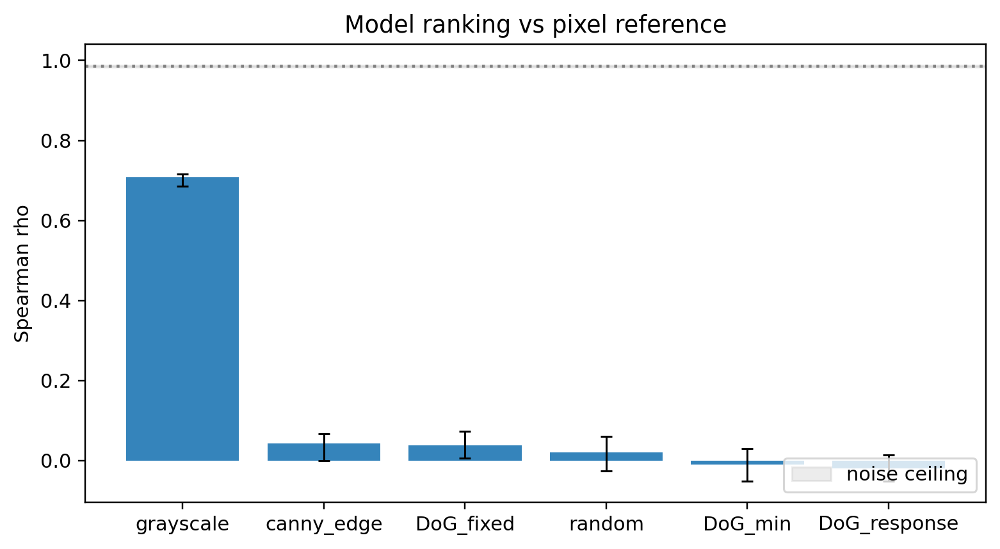


Results vs VGG conv3_3 reference
          method       rho        lo        hi    p_perm    p_holm  \
0  DoG_response  0.100897  0.070378  0.151359  0.090909  0.545455   
1     DoG_fixed  0.100172  0.078767  0.145460  0.090909  0.545455   
2     grayscale  0.041873  0.029628  0.075543  0.090909  0.545455   
3       DoG_min  0.039032  0.000626  0.082242  0.090909  0.545455   
4        random -0.016521 -0.043590  0.022828  0.909091  1.000000   
5    canny_edge -0.075228 -0.102673 -0.027816  1.000000  1.000000   

   frac_ceiling   EV_norm  
0      0.111185  0.012362  
1      0.110386  0.012185  
2      0.046143  0.002129  
3      0.043012  0.001850  
4     -0.018206  0.000331  
5     -0.082899  0.006872  


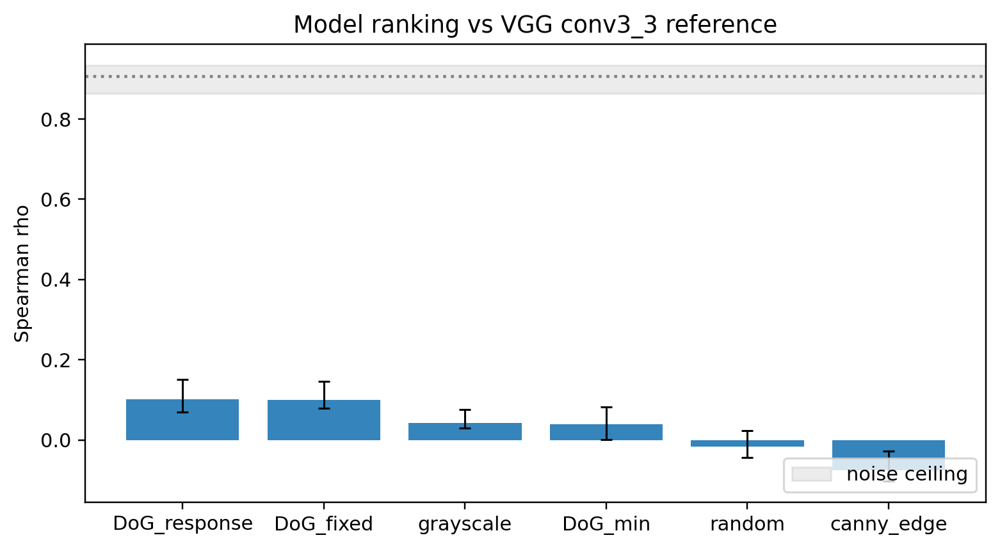

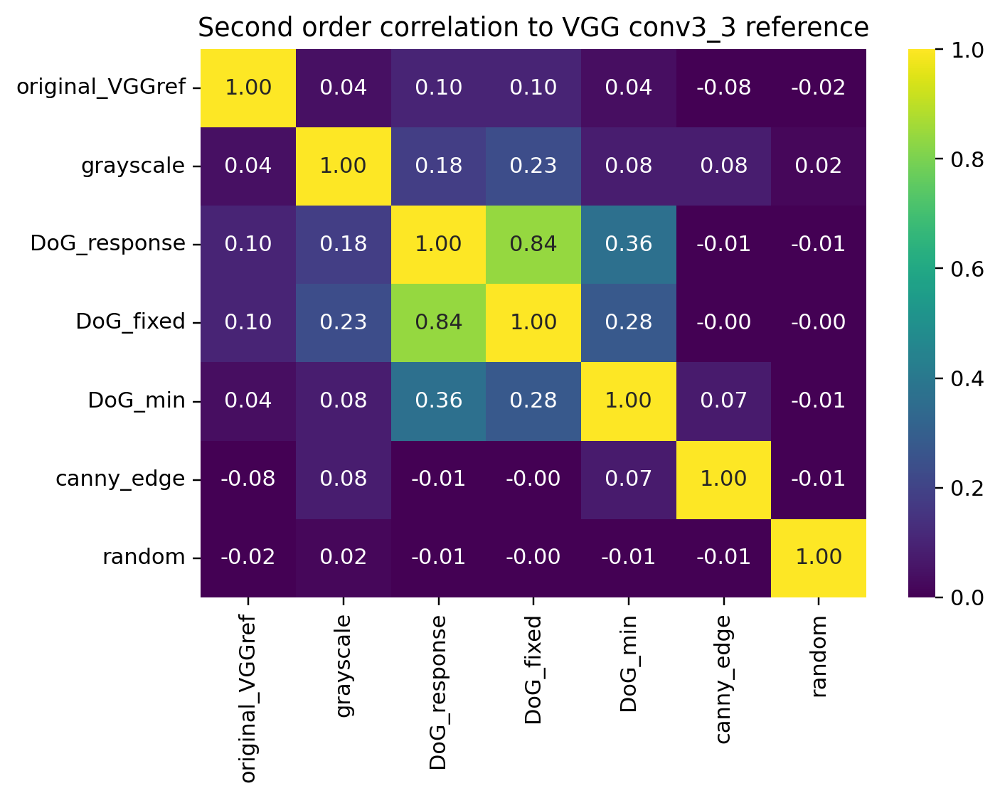

In [15]:
"""
RSA with pixel reference and VGG feature reference (no masking)
image_processing_dict[idx]['image']                -> torch [1,1,H,W] in [0,1]
image_processing_dict[idx][method]['phosphenes']  -> torch [1,1,H,W] in [0,1]
"""

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import spearmanr
from scipy.cluster.hierarchy import linkage, leaves_list

import torch
import torch.nn.functional as F
import torchvision as tv

# ======================
# CONFIG
# ======================
SAVE_DIR      = "./rsa_out_vgg"
POOL_K        = 4              # average pool factor for pixel RSA
USE_RP        = True           # random projection after pooling
RP_DIM        = 1024           # target dim for RP
N_BOOT        = 10           # raise later for camera ready
N_PERM        = 10           # raise to 10000 if you need p ~ 1e-4
VGG_LAYER     = "conv3_3"      # one of: conv1_2, conv2_2, conv3_3, conv4_3, conv5_3
VGG_BATCH     = 64             # batch size for feature extraction
METHODS_IN_FEATURE_SPACE = False  # set True to also feed method images through VGG
RANDOM_SEED   = 1234
FIG_DPI       = 220

os.makedirs(SAVE_DIR, exist_ok=True)
device = "cuda" if torch.cuda.is_available() else "cpu"
rng = np.random.default_rng(RANDOM_SEED)

# ======================
# helpers
# ======================
def build_tensors_no_mask(ipd, methods, device):
    ids = sorted(ipd.keys())
    H = ipd[ids[0]]['image'][0,0].shape[0]
    W = ipd[ids[0]]['image'][0,0].shape[1]
    Xo = []
    Xm = {m: [] for m in methods}
    for i in ids:
        Xo.append(ipd[i]['image'][0,0].to(device))
        for m in methods:
            Xm[m].append(ipd[i][m]['phosphenes'][0,0].to(device))
    Xo = torch.stack(Xo, dim=0)                                # [N, H, W]
    Xm = {m: torch.stack(Xm[m], dim=0) for m in methods}       # [N, H, W]
    return Xo, Xm, H, W

def avgpool_images(x_hw, k=2):
    # x_hw: [N,H,W] in [0,1]
    x = x_hw.unsqueeze(1)                                      # [N,1,H,W]
    x = F.avg_pool2d(x, kernel_size=k, stride=k)               # [N,1,H',W']
    x = x.squeeze(1)                                           # [N,H',W']
    return x

def random_projection_np(X_np, out_dim=1024, seed=123):
    rng = np.random.default_rng(seed)
    N, D = X_np.shape
    W = rng.standard_normal((D, out_dim)).astype(np.float32) / np.sqrt(D)
    return X_np.astype(np.float32) @ W

@torch.no_grad()
def corr_rdm_gpu_from_vectors(X):
    """
    X: torch [N,D] on device, float32
    returns numpy RDM [N,N] with correlation distances in [0,2]
    """
    mu = X.mean(dim=1, keepdim=True)
    sd = X.std(dim=1, keepdim=True)
    sd = torch.where(sd < 1e-8, torch.ones_like(sd), sd)
    Z = (X - mu) / sd
    denom = max(Z.shape[1] - 1, 1)
    C = (Z @ Z.T) / denom
    C = torch.clamp(C, -1.0, 1.0)
    return (1.0 - C).float().cpu().numpy()

def safe_spearman(a, b):
    if np.allclose(a, a[0]) or np.allclose(b, b[0]):
        return np.nan
    return spearmanr(a, b).statistic

def upper_tri(rdm):
    N = rdm.shape[0]
    tri = np.triu_indices(N, 1)
    return rdm[tri]

def bootstrap_rsa(rdm_ref, rdm_m, B=N_BOOT, seed=RANDOM_SEED):
    rng = np.random.default_rng(seed)
    N = rdm_ref.shape[0]
    out = np.empty(B, np.float32)
    for b in range(B):
        sub = rng.integers(0, N, size=N)
        rr = rdm_ref[np.ix_(sub, sub)]
        rm = rdm_m[np.ix_(sub, sub)]
        tri = np.triu_indices(len(sub), 1)
        out[b] = spearmanr(rr[tri], rm[tri]).statistic
    return out

def permute_rsa_p(rdm_ref, rdm_m, n_perm=N_PERM, seed=RANDOM_SEED):
    rng = np.random.default_rng(seed)
    N = rdm_ref.shape[0]
    tri = np.triu_indices(N, 1)
    obs = spearmanr(rdm_ref[tri], rdm_m[tri]).statistic
    idx = np.arange(N)
    null = np.empty(n_perm, np.float32)
    for k in range(n_perm):
        p = rng.permutation(idx)
        rm = rdm_m[p][:, p]
        null[k] = spearmanr(rdm_ref[tri], rm[tri]).statistic
    pval = (np.sum(null >= obs) + 1) / (n_perm + 1)
    return obs, pval, null

def holm_correction(pvals):
    pvals = np.asarray(pvals, float)
    m = len(pvals)
    order = np.argsort(pvals)
    adj = np.empty_like(pvals)
    prev = 0.0
    for k, i in enumerate(order, start=1):
        adj[i] = max(prev, (m - k + 1) * pvals[i])
        prev = adj[i]
    return np.minimum(adj, 1.0)

def split_half_ceiling_features(X_np, R=600, seed=RANDOM_SEED):
    rng = np.random.default_rng(seed)
    N, D = X_np.shape
    D2 = (D // 2) * 2
    if D2 < 2:
        return np.nan, np.nan, np.nan
    half = D2 // 2
    tri = np.triu_indices(N, 1)
    vals = []
    for _ in range(R):
        perm = rng.permutation(D2)
        F1, F2 = perm[:half], perm[half:D2]
        r1 = corr_rdm_gpu_from_vectors(torch.from_numpy(X_np[:, F1]).to(device))
        r2 = corr_rdm_gpu_from_vectors(torch.from_numpy(X_np[:, F2]).to(device))
        rho = spearmanr(r1[tri], r2[tri]).statistic
        vals.append((2 * rho) / (1 + rho))
    vals = np.array(vals)
    return np.percentile(vals, [2.5, 50, 97.5])

def cmdscale(D, k=2):
    n = D.shape[0]
    J = np.eye(n) - np.ones((n, n)) / n
    B = -0.5 * J @ (D**2) @ J
    w, V = np.linalg.eigh(B)
    idx = np.argsort(w)[::-1]
    w, V = w[idx], V[:, idx]
    L = np.diag(np.sqrt(np.maximum(w[:k], 0)))
    return V[:, :k] @ L

# ======================
# VGG feature extractor
# ======================
def build_vgg_until(layer_name="conv3_3", device="cpu"):
    layer_idx = {"conv1_2": 4, "conv2_2": 9, "conv3_3": 16, "conv4_3": 23, "conv5_3": 30}
    idx = layer_idx[layer_name]
    vgg = tv.models.vgg16(weights=tv.models.VGG16_Weights.IMAGENET1K_FEATURES).features[:idx]
    vgg.eval().to(device)
    for p in vgg.parameters():
        p.requires_grad = False
    return vgg

@torch.no_grad()
def vgg_features_from_grayscale(x_hw, vgg, batch=64, device="cpu"):
    """
    x_hw: torch [N,H,W] in [0,1]
    returns: numpy array [N, C] after global average pooling over spatial dims
    """
    N, H, W = x_hw.shape
    # prepare mean and std as registered buffers
    mean = torch.tensor([0.485, 0.456, 0.406], device=device).view(1,3,1,1)
    std  = torch.tensor([0.229, 0.224, 0.225], device=device).view(1,3,1,1)

    feats = []
    for s in range(0, N, batch):
        e = min(s + batch, N)
        x = x_hw[s:e]                                   # [b,H,W]
        x = x.unsqueeze(1).expand(-1, 3, -1, -1)        # replicate to RGB
        x = F.interpolate(x, size=(224, 224), mode="bilinear", align_corners=False)
        x = (x - mean) / std
        y = vgg(x.to(device))                           # [b,C,Hf,Wf]
        y = F.adaptive_avg_pool2d(y, 1).squeeze(-1).squeeze(-1)  # [b,C]
        feats.append(y.detach().cpu())
    Fv = torch.cat(feats, dim=0)                        # [N,C]
    return Fv.numpy().astype(np.float32)

# ======================
# build tensors
# ======================
methods = [k for k in image_processing_dict[next(iter(image_processing_dict))].keys() if k != 'image']
orig_hw, meth_hw, H, W = build_tensors_no_mask(image_processing_dict, methods, device)

print("Device:", device, "  N images:", orig_hw.shape[0], "  HxW:", H, "x", W)

# ======================
# 1) pixel RSA path (pool + optional RP)
# ======================
orig_pool = avgpool_images(orig_hw, k=POOL_K)                  # [N,H',W']
meth_pool = {m: avgpool_images(meth_hw[m], k=POOL_K) for m in methods}

orig_vec = orig_pool.flatten(1)                                # [N,Dp]
meth_vec = {m: meth_pool[m].flatten(1) for m in methods}       # [N,Dp]

orig_np = orig_vec.cpu().numpy()
meth_np = {m: meth_vec[m].cpu().numpy() for m in methods}

if USE_RP:
    orig_np = random_projection_np(orig_np, out_dim=RP_DIM, seed=RANDOM_SEED)
    meth_np = {m: random_projection_np(meth_np[m], out_dim=RP_DIM, seed=RANDOM_SEED) for m in methods}

rdm_pix_ref = corr_rdm_gpu_from_vectors(torch.from_numpy(orig_np).to(device))
rdm_pix_m   = {m: corr_rdm_gpu_from_vectors(torch.from_numpy(meth_np[m]).to(device)) for m in methods}

# evaluate to pixel reference
def eval_against_ref(rdm_ref, rdm_methods, methods, label, save_prefix):
    rows = []
    N = rdm_ref.shape[0]
    tri = np.triu_indices(N, 1)
    v_ref = rdm_ref[tri]
    for m in methods:
        rho = safe_spearman(v_ref, rdm_methods[m][tri])
        boot = bootstrap_rsa(rdm_ref, rdm_methods[m], B=N_BOOT, seed=RANDOM_SEED)
        lo, hi = np.percentile(boot, [2.5, 97.5])
        rho_p, pval, _ = permute_rsa_p(rdm_ref, rdm_methods[m], n_perm=N_PERM, seed=RANDOM_SEED)
        rows.append({"method": m, "rho": rho, "lo": lo, "hi": hi, "p_perm": pval})
    df = pd.DataFrame(rows).sort_values("rho", ascending=False).reset_index(drop=True)
    df["p_holm"] = holm_correction(df["p_perm"].values)
    # ceiling on the reference features used to build this ref RDM
    # here we only have the original reference features for pixel path
    if label == "pixel":
        loC, medC, hiC = split_half_ceiling_features(orig_np, R=600, seed=RANDOM_SEED)
    else:
        loC, medC, hiC = split_half_ceiling_features(F_vgg_np, R=600, seed=RANDOM_SEED)
    df["frac_ceiling"] = df["rho"] / medC if np.isfinite(medC) and medC != 0 else np.nan
    df["EV_norm"]      = (df["rho"] / medC) ** 2 if np.isfinite(medC) and medC != 0 else np.nan
    print(f"\nResults vs {label} reference\n", df)
    df.to_csv(os.path.join(SAVE_DIR, f"rsa_results_{save_prefix}.csv"), index=False)

    # bar plot
    plt.figure(figsize=(max(6, 1.2*len(df)), 4), dpi=FIG_DPI)
    bars = plt.bar(df["method"], df["rho"], color="C0", alpha=0.9)
    plt.errorbar(df["method"], df["rho"],
                 yerr=[df["rho"]-df["lo"], df["hi"]-df["rho"]],
                 fmt="none", ecolor="k", capsize=3, lw=1)
    if np.isfinite(loC) and np.isfinite(hiC):
        plt.axhspan(loC, hiC, color="gray", alpha=0.15, label="noise ceiling")
        plt.axhline(medC, color="gray", linestyle=":")
    plt.ylabel("Spearman rho")
    plt.title(f"Model ranking vs {label} reference")
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.savefig(os.path.join(SAVE_DIR, f"rsa_ranking_{save_prefix}.png"), dpi=FIG_DPI)
    plt.show()
    return df

df_pix = eval_against_ref(rdm_pix_ref, rdm_pix_m, methods, label="pixel", save_prefix="pixel")

# ======================
# 2) VGG feature reference
# ======================
vgg = build_vgg_until(VGG_LAYER, device=device)
F_vgg_np = vgg_features_from_grayscale(orig_hw, vgg, batch=VGG_BATCH, device=device)   # [N,C]
rdm_vgg_ref = corr_rdm_gpu_from_vectors(torch.from_numpy(F_vgg_np).to(device))

# choose method RDMs for VGG RSA
if METHODS_IN_FEATURE_SPACE:
    # compute VGG features for each method too (heavier, but fairer)
    rdm_vgg_m = {}
    for m in methods:
        Fm = vgg_features_from_grayscale(meth_hw[m], vgg, batch=VGG_BATCH, device=device)
        rdm_vgg_m[m] = corr_rdm_gpu_from_vectors(torch.from_numpy(Fm).to(device))
else:
    # reuse pixel RDMs of the methods and compare to VGG reference
    rdm_vgg_m = rdm_pix_m

df_vgg = eval_against_ref(rdm_vgg_ref, rdm_vgg_m, methods, label=f"VGG {VGG_LAYER}", save_prefix=f"vgg_{VGG_LAYER}")

# ======================
# 3) second order matrix to the chosen reference (optional)
# here show second order to VGG reference
names = ["original_VGGref"] + methods
vecs  = {"original_VGGref": upper_tri(rdm_vgg_ref)}
for m in methods:
    vecs[m] = upper_tri(rdm_vgg_m[m])

S = np.zeros((len(names), len(names)), np.float32)
for i, ni in enumerate(names):
    for j, nj in enumerate(names):
        S[i, j] = safe_spearman(vecs[ni], vecs[nj])

plt.figure(figsize=(6.8, 5.2), dpi=FIG_DPI)
sns.heatmap(S, vmin=0, vmax=1, cmap="viridis",
            xticklabels=names, yticklabels=names,
            annot=np.round(S, 2), fmt=".2f")
plt.title(f"Second order correlation to VGG {VGG_LAYER} reference")
plt.tight_layout()
plt.savefig(os.path.join(SAVE_DIR, f"second_order_matrix_vgg_{VGG_LAYER}.png"), dpi=FIG_DPI)
plt.show()
